#Copy data from Google drive to local

In [ ]:
from google.colab import drive
drive.mount('/content/gdrive')

from shutil import copyfile
import os
import zipfile

local_zip = '/tmp/data.zip'
copyfile('/content/gdrive/data.zip', local_zip)




Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


#Extract and copy data from local folder




In [ ]:
from shutil import copyfile
import os
import zipfile

local_zip = '/tmp/data.zip'

zip_ref = zipfile.ZipFile(local_zip, 'r')
zip_ref.extractall('/tmp')
zip_ref.close() 

base_dir = '/tmp/data'
train_dir = os.path.join(base_dir, 'train')
validation_dir = os.path.join(base_dir, 'validation')

# Directory with our training  pictures
train_collapsed_building_dir = os.path.join(train_dir, 'collapsed_building')
train_fire_dir = os.path.join(train_dir, 'fire')
train_flooded_areas_dir = os.path.join(train_dir, 'flooded_areas')
train_normal_dir = os.path.join(train_dir, 'normal')
train_traffic_incident_dir = os.path.join(train_dir, 'traffic_incident')


# Directory with our validation cat pictures
validation_collapsed_building_dir = os.path.join(validation_dir, 'collapsed_building')

validation_fire_dir = os.path.join(validation_dir, 'fire')
validation_flooded_areas_dir = os.path.join(validation_dir, 'flooded_areas')
validation_normal_dir = os.path.join(validation_dir, 'normal')
validation_traffic_incident_dir = os.path.join(validation_dir, 'traffic_incident')


train_collapsed_building_dir_fnames = os.listdir(train_collapsed_building_dir)
train_fire_dir_fnames = os.listdir(train_fire_dir)
train_flooded_areas_fnames = os.listdir(train_flooded_areas_dir)
train_normal_fnames = os.listdir(train_normal_dir)
train_traffic_incident_fnames = os.listdir(train_traffic_incident_dir)

#Plot a sample image with data augmentation

/tmp/data/train/collapsed_building/collapsed_building_image0259.jpg


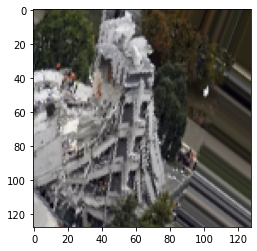

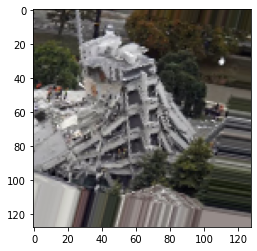

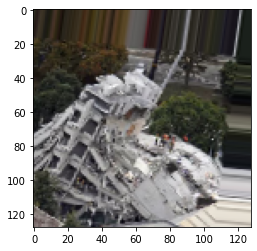

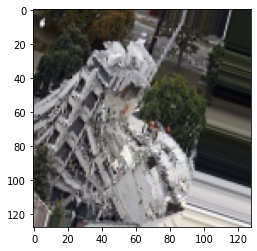

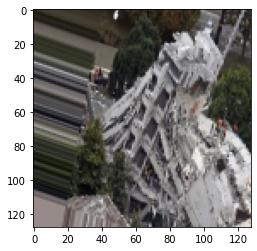

In [ ]:
%matplotlib inline

import matplotlib.pyplot as plt
import matplotlib.image as mpimg

from tensorflow.keras.preprocessing.image import array_to_img, img_to_array, load_img
from tensorflow.keras.preprocessing.image import ImageDataGenerator

datagen = ImageDataGenerator(
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,
      fill_mode='nearest')

img_path = os.path.join(train_collapsed_building_dir, train_collapsed_building_dir_fnames[2])
print(img_path)
img = load_img(img_path, target_size=(128, 128))  # this is a PIL image
x = img_to_array(img)  # Numpy array with shape (150, 150, 3)
x = x.reshape((1,) + x.shape)  # Numpy array with shape (1, 150, 150, 3)

# The .flow() command below generates batches of randomly transformed images
# It will loop indefinitely, so we need to `break` the loop at some point!
i = 0
for batch in datagen.flow(x, batch_size=1):
  plt.figure(i)
  imgplot = plt.imshow(array_to_img(batch[0]))
  i += 1
  if i % 5 == 0:
    break

## Add Data Augmentation to the Preprocessing Step. 



In [ ]:
# Adding rescale, rotation_range, width_shift_range, height_shift_range,
# shear_range, zoom_range, and horizontal flip to our ImageDataGenerator
def make_generator(train_dir, validation_dir, image_size):
  train_datagen = ImageDataGenerator(
      rescale=1./255,
      rotation_range=40,
      width_shift_range=0.2,
      height_shift_range=0.2,
      shear_range=0.2,
      zoom_range=0.2,
      horizontal_flip=True,)
  #train_datagen = ImageDataGenerator(rescale=1./255)

  # Note that the validation data should not be augmented!
  val_datagen = ImageDataGenerator(rescale=1./255)

  # Flow training images in batches of 32 using train_datagen generator
  train_generator = train_datagen.flow_from_directory(
          train_dir,  # This is the source directory for training images
          target_size=(image_size, image_size),  # All images will be resized to 150x150
          batch_size=20,
          class_mode='categorical')
  validation_generator = val_datagen.flow_from_directory(
          validation_dir,
          target_size=(image_size, image_size),
          batch_size=20,
          class_mode='categorical')
  print(train_generator.class_indices)
  print(validation_generator.class_indices)
  return (train_generator, validation_generator)




#Functions to create model from trained models

In [ ]:
from tensorflow.keras import layers
from tensorflow.keras import Model
from tensorflow.keras.optimizers import RMSprop

def make_model(model_name):
  img_input = layers.Input(shape=(150, 150, 3))
  base_model = model_name(input_tensor=img_input, weights='imagenet', include_top=False)
  x = base_model.output
  x = layers.GlobalAveragePooling2D(name='avg_pool')(x)
  x = layers.Dropout(0.5)(x)
  output = layers.Dense(5, activation='softmax')(x)

  for layer in base_model.layers:
      layer.trainable = False

  # Configure and compile the model
  model = Model(img_input, output)
  model.compile(loss='categorical_crossentropy',
                optimizer=RMSprop(lr=0.001),
                metrics=['acc'])
    
  return model


#Function to train a model 

In [ ]:
def train(model, train_generator, validation_generator, epochs):
  history = model.fit_generator(
      train_generator,
      steps_per_epoch=100,
      epochs=epochs,
      validation_data=validation_generator,
      validation_steps=20,
      verbose=2)
  return history

#Function to plot various graphs


In [ ]:
# Retrieve a list of accuracy results on training and validation data
# sets for each training epoch
def plot_graphs(model_history_dict):
  # Get number of epochs
  first_history = list(model_history_dict.items())[0]
  epochs = range(len(first_history[1].history['acc']))
  # Plot training and validation accuracy per epoch
  for model, history in model_history_dict.items():
    plt.plot(epochs, history.history['acc'], label='training')
    plt.plot(epochs, history.history['val_acc'], label='validation')
    plt.title(f'{model} Training and validation accuracy')
    plt.legend(loc='lower right')
    plt.figure()

  for model, history in model_history_dict.items():
    plt.plot(epochs, history.history['loss'], label='training')
    plt.plot(epochs, history.history['val_loss'], label='validation')
    plt.title(f'{model} Training and validation loss')
    plt.legend(loc='upper right')
    plt.figure()

  plt.title('Training accuracy')
  for model, history in model_history_dict.items():
    plt.plot(epochs, history.history['acc'], label=f'{model}')
  plt.legend(loc='lower right')
  plt.figure()    

  plt.title('Validation accuracy')
  for model, history in model_history_dict.items():
    plt.plot(epochs, history.history['val_acc'], label=f'{model}')
  plt.legend(loc='lower right')
  plt.figure()  

  plt.title('Training loss')
  for model, history in model_history_dict.items():
     plt.plot(epochs, history.history['loss'], label=f'{model}')
  plt.legend(loc='upper right')
  plt.figure()  

  plt.title('Validation loss')
  for model, history in model_history_dict.items():
     plt.plot(epochs, history.history['loss'], label=f'{model}')
  plt.legend(loc='upper right')
  plt.figure()  


#Function to train a list of models

In [ ]:
def train_models(model_dict, train_dir, validation_dir, image_size, epochs):
  models = {}
  history_dict = {}

  for model_name,model_class, in model_dict.items():
    print(f'Training {model_name} Model')
    model = make_model(model_class)
    model_history = train(model, *make_generator(train_dir, validation_dir, image_size), epochs)   
    models[model_name] = model
    history_dict[model_name]=model_history
  return models, history_dict


# Trains various models for 20 epochs

In [ ]:
image_size=150
epochs=20
from tensorflow.keras.applications.inception_v3 import InceptionV3
from tensorflow.keras.applications.inception_resnet_v2 import InceptionResNetV2
from tensorflow.keras.applications.xception import Xception
from tensorflow.keras.applications.resnet_v2 import ResNet152V2
from tensorflow.keras.applications.vgg16 import VGG16
from tensorflow.keras.applications.vgg19 import VGG19
from tensorflow.keras.applications.densenet import DenseNet201

model_dict = {'inception v3' : InceptionV3, 
              'inception v2' : InceptionResNetV2,
              'xception' : Xception,
              'resnet_152_v2' : ResNet152V2, 
              'DenseNet201' : DenseNet201}
models, model_history_dict = train_models(model_dict, train_dir, validation_dir, image_size, epochs)




Training inception v3 Model
Found 2000 images belonging to 5 classes.
Found 400 images belonging to 5 classes.
{'collapsed_building': 0, 'fire': 1, 'flooded_areas': 2, 'normal': 3, 'traffic_incident': 4}
{'collapsed_building': 0, 'fire': 1, 'flooded_areas': 2, 'normal': 3, 'traffic_incident': 4}
Epoch 1/20
100/100 - 24s - loss: 1.3505 - acc: 0.5735 - val_loss: 0.6565 - val_acc: 0.7725
Epoch 2/20
100/100 - 22s - loss: 0.8919 - acc: 0.7040 - val_loss: 0.5814 - val_acc: 0.8075
Epoch 3/20
100/100 - 22s - loss: 0.7913 - acc: 0.7585 - val_loss: 0.5209 - val_acc: 0.8400
Epoch 4/20
100/100 - 22s - loss: 0.7581 - acc: 0.7795 - val_loss: 0.4062 - val_acc: 0.8775
Epoch 5/20
100/100 - 22s - loss: 0.6858 - acc: 0.7885 - val_loss: 0.4291 - val_acc: 0.8575
Epoch 6/20
100/100 - 22s - loss: 0.7063 - acc: 0.8070 - val_loss: 0.4288 - val_acc: 0.8675
Epoch 7/20
100/100 - 22s - loss: 0.6213 - acc: 0.8200 - val_loss: 0.4046 - val_acc: 0.8850
Epoch 8/20
100/100 - 22s - loss: 0.6258 - acc: 0.8205 - val_loss: 

#Plot various graphs

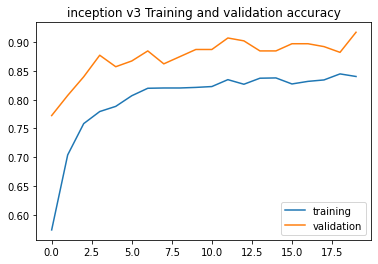

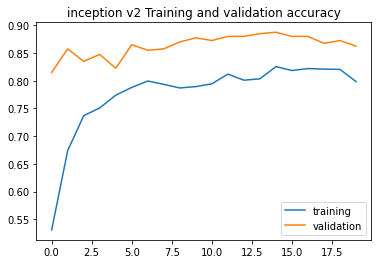

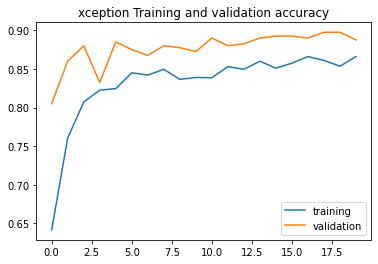

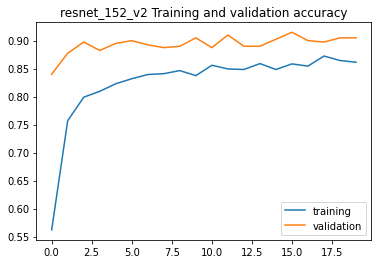

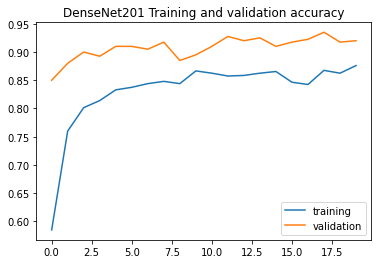

...

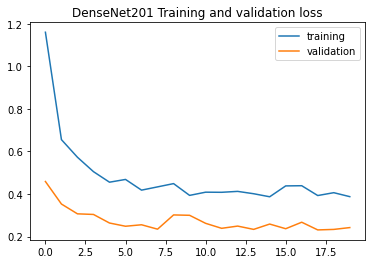

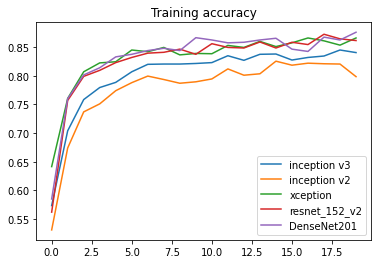

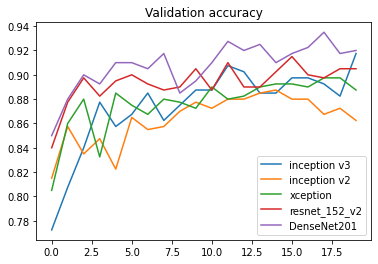

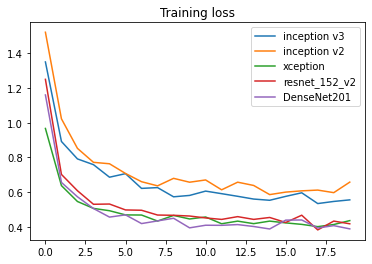

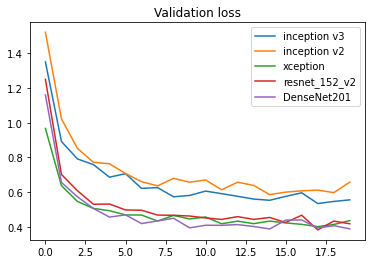

<Figure size 432x288 with 0 Axes>

In [ ]:
plot_graphs(model_history_dict)

#Save the various models. 

In [ ]:
for model_name, model in models.items():
  model.save(f'/tmp/model_transformation_{epochs}_epochs_{model_name}')

INFO:tensorflow:Assets written to: /content/gdrive/My Drive/model_transformation_20_epochs_inception v3/assets
INFO:tensorflow:Assets written to: /content/gdrive/My Drive/model_transformation_20_epochs_inception v2/assets
INFO:tensorflow:Assets written to: /content/gdrive/My Drive/model_transformation_20_epochs_xception/assets
INFO:tensorflow:Assets written to: /content/gdrive/My Drive/model_transformation_20_epochs_resnet_152_v2/assets
INFO:tensorflow:Assets written to: /content/gdrive/My Drive/model_transformation_20_epochs_DenseNet201/assets


#Load a  model and make predictions

In [ ]:
from keras.models import load_model
import cv2
import numpy as np

loaded_model = load_model('/tmp/saved_model_transformation_20_epochs_inception v2')
loaded_model.layers[0].input_shape

from keras.preprocessing import image
from keras.utils.np_utils import to_categorical
import matplotlib.pyplot as plt

IMG_SIZE = 150
image_path="/tmp/data/train/normal/normal_image0002.jpg"
img = image.load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))
img = np.expand_dims(img, axis=0)
img = img/255.
plt.imshow(img[0])
result=loaded_model.predict(img)
print(result[0])
prediction = np.argmax(result[0])
print(prediction)


[(None, 150, 150, 3)]

#Make predictions

In [ ]:
from keras.preprocessing import image
from keras.utils.np_utils import to_categorical
import matplotlib.pyplot as plt
import numpy as np
import os

image_folder_classes = ['collapsed_building', 'fire', 'flooded_areas', 'normal', 'traffic_incident']

total = 0;
correct = 0;

all_true_labels=[]
all_predicted_label=[]

for target_class, image_folder_class in enumerate(image_folder_classes, start=0):
  img_width = 150
  img_height = 150
  folder_path = '/tmp/data/validation/' + image_folder_class
  images = []
  for img in os.listdir(folder_path):
      img = os.path.join(folder_path, img)
      if img.endswith(".DS_Store"):
        continue
      img = image.load_img(img, target_size=(img_width, img_height))
      img = image.img_to_array(img)
      img = img/255.
      img = np.expand_dims(img, axis=0)
      images.append(img)
      all_true_labels.append(target_class)

  # stack up images list to pass for prediction
  images = np.vstack(images)
  print(images.shape)
  classes = loaded_model.predict(images, batch_size=10)
 
  predicted_labels = np.argmax(classes, axis=1)
  all_predicted_label.extend(predicted_labels)
  total = total + len(images)
  correct = correct + np.count_nonzero(predicted_labels==target_class)
  print(image_folder_class, len(images), target_class,np.count_nonzero(predicted_labels==target_class))

print(correct, total, correct/total)
print(len(all_true_labels), len(all_predicted_label))


(80, 150, 150, 3)
collapsed_building 80 0 58
(80, 150, 150, 3)
fire 80 1 80
(80, 150, 150, 3)
flooded_areas 80 2 68
(80, 150, 150, 3)
normal 80 3 68
(80, 150, 150, 3)
traffic_incident 80 4 74
348 400 0.87
400 400


#Function to plot confusion matrix

In [ ]:
#https://www.kaggle.com/grfiv4/plot-a-confusion-matrix
import numpy as np


def plot_confusion_matrix(cm,
                          target_names,
                          title='Confusion matrix',
                          cmap=None,
                          normalize=True):
    """
    given a sklearn confusion matrix (cm), make a nice plot

    Arguments
    ---------
    cm:           confusion matrix from sklearn.metrics.confusion_matrix

    target_names: given classification classes such as [0, 1, 2]
                  the class names, for example: ['high', 'medium', 'low']

    title:        the text to display at the top of the matrix

    cmap:         the gradient of the values displayed from matplotlib.pyplot.cm
                  see http://matplotlib.org/examples/color/colormaps_reference.html
                  plt.get_cmap('jet') or plt.cm.Blues

    normalize:    If False, plot the raw numbers
                  If True, plot the proportions

    Usage
    -----
    plot_confusion_matrix(cm           = cm,                  # confusion matrix created by
                                                              # sklearn.metrics.confusion_matrix
                          normalize    = True,                # show proportions
                          target_names = y_labels_vals,       # list of names of the classes
                          title        = best_estimator_name) # title of graph

    Citiation
    ---------
    http://scikit-learn.org/stable/auto_examples/model_selection/plot_confusion_matrix.html

    """
    import matplotlib.pyplot as plt
    import numpy as np
    import itertools

    accuracy = np.trace(cm) / float(np.sum(cm))
    misclass = 1 - accuracy

    if cmap is None:
        cmap = plt.get_cmap('Blues')

    plt.figure(figsize=(8, 6))
    plt.imshow(cm, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()

    if target_names is not None:
        tick_marks = np.arange(len(target_names))
        plt.xticks(tick_marks, target_names, rotation=45)
        plt.yticks(tick_marks, target_names)

    if normalize:
        cm = cm.astype('float') / cm.sum(axis=1)[:, np.newaxis]


    thresh = cm.max() / 1.5 if normalize else cm.max() / 2
    for i, j in itertools.product(range(cm.shape[0]), range(cm.shape[1])):
        if normalize:
            plt.text(j, i, "{:0.4f}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")
        else:
            plt.text(j, i, "{:,}".format(cm[i, j]),
                     horizontalalignment="center",
                     color="white" if cm[i, j] > thresh else "black")


    plt.tight_layout()
    plt.ylabel('True label')
    plt.xlabel('Predicted label\naccuracy={:0.4f}; misclass={:0.4f}'.format(accuracy, misclass))
    plt.show()


#Plot confusion matrix and scores

                    precision    recall  f1-score   support

collapsed_building       0.97      0.72      0.83        80
              fire       0.91      1.00      0.95        80
     flooded_areas       0.89      0.85      0.87        80
            normal       0.93      0.85      0.89        80
  traffic_incident       0.72      0.93      0.81        80

          accuracy                           0.87       400
         macro avg       0.88      0.87      0.87       400
      weighted avg       0.88      0.87      0.87       400



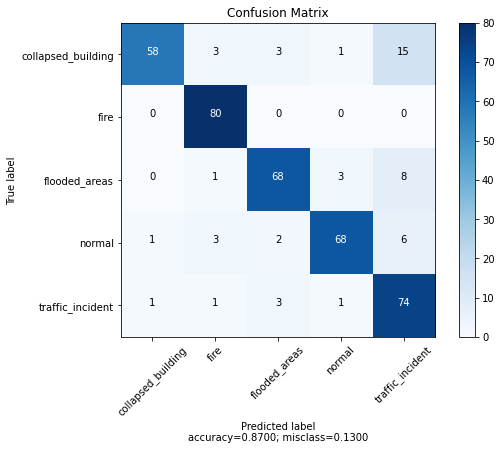

In [ ]:
from sklearn.metrics import classification_report
from sklearn.metrics import confusion_matrix
import matplotlib.pyplot as plt 

target_names = ['collapsed_building', 'fire', 'flooded_areas', 'normal', 'traffic_incident']
#target_names = ['negative', 'postive']
print(classification_report(all_true_labels, all_predicted_label, target_names=target_names))
           
cm = confusion_matrix(all_true_labels, all_predicted_label)
plot_confusion_matrix(cm, normalize=False, target_names = target_names, title = "Confusion Matrix")

## Visualize activations


In [ ]:
from tensorflow.keras import Model
layer_outputs = [layer.output for layer in loaded_model.layers]
# Extracts the outputs of the top 12 layers
activation_model = Model(inputs=loaded_model.input, outputs=layer_outputs) # Creates a model that will return these outputs, given the model input

from keras.preprocessing import image


IMG_SIZE = 150
image_path="/tmp/data/train/normal/normal_image0002.jpg"
img = image.load_img(image_path, target_size=(IMG_SIZE, IMG_SIZE))
img = np.expand_dims(img, axis=0)
img = img/255.
activations = activation_model.predict(img) 

(1, 74, 74, 32)


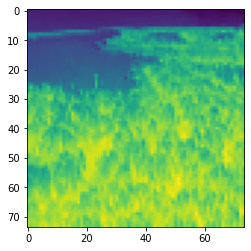

In [ ]:
first_layer_activation = activations[1]
print(first_layer_activation.shape)
import matplotlib.pyplot as plt
plt.imshow(first_layer_activation[0,:,:,3])


/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:24: RuntimeWarning: invalid value encountered in true_divide
/usr/local/lib/python3.6/dist-packages/ipykernel_launcher.py:32: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


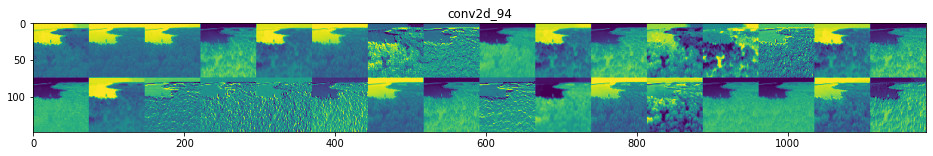

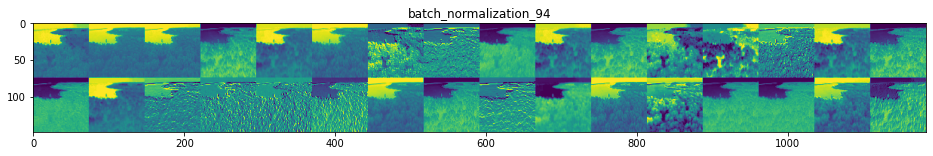

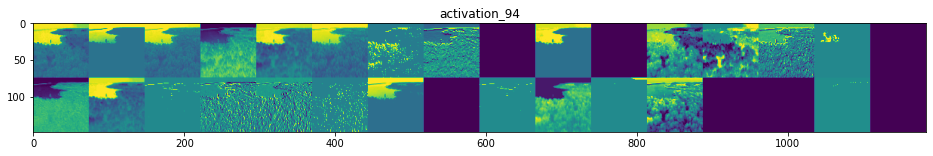

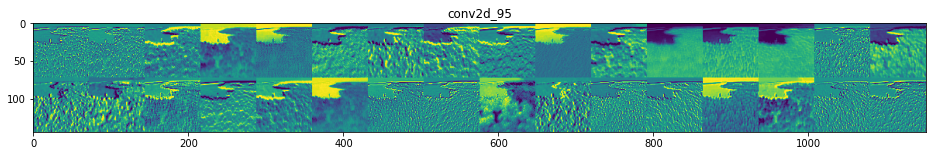

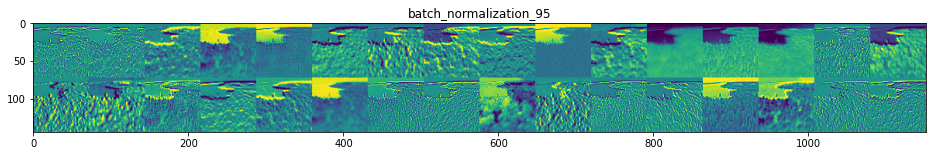

...

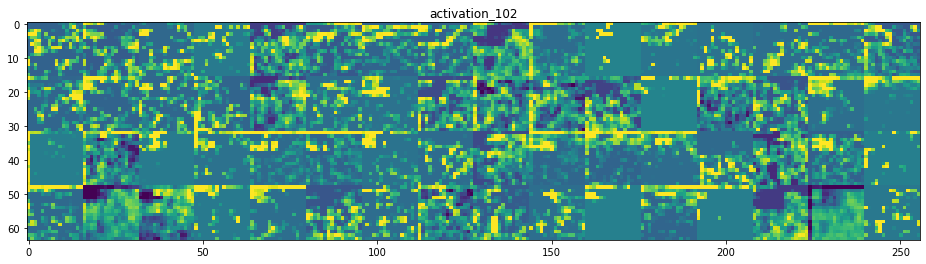

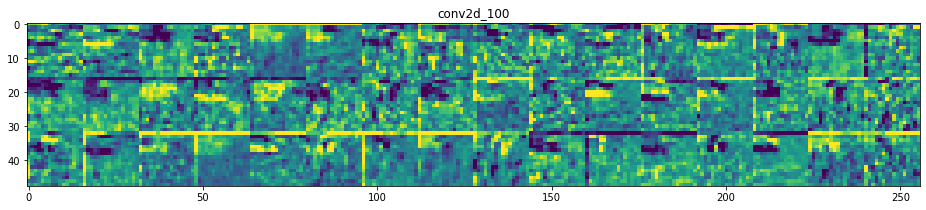

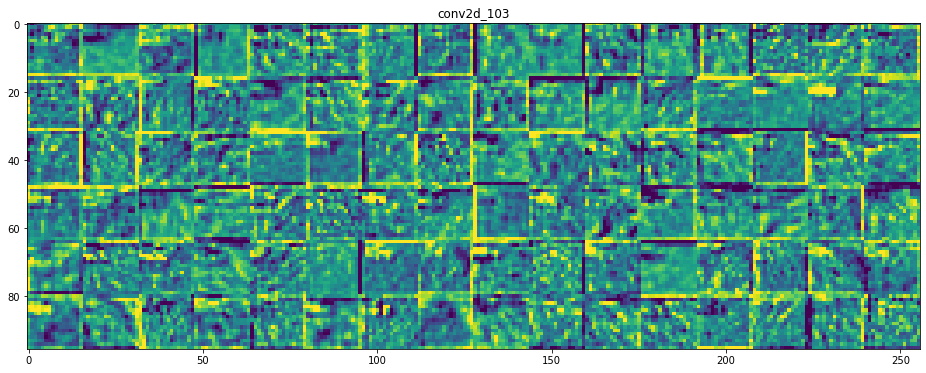

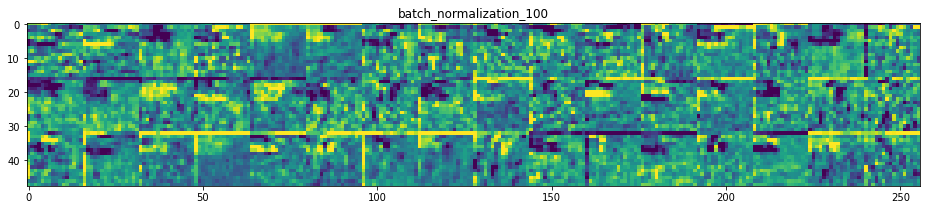

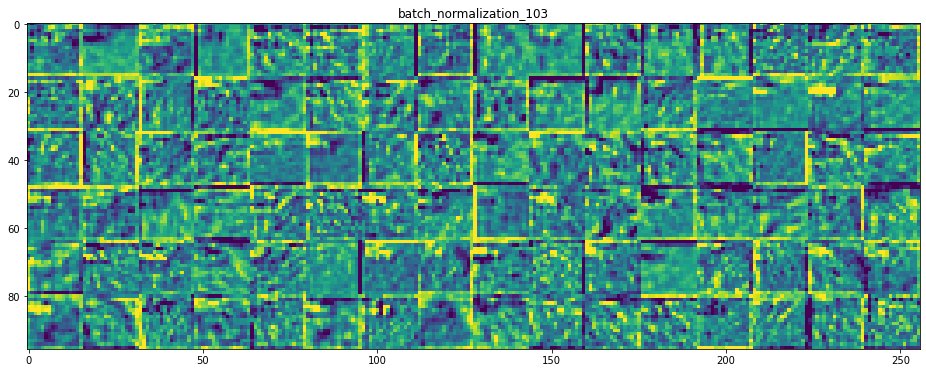

In [ ]:
layer_names = []
images_per_row = 16
# for layer in activation_model.layers[1:12]:
#     layer_names.append(layer.name) # Names of the layers, so you can have them as part of your plot​
# images_per_row = 16
# for layer_name, layer_activation in zip(layer_names, activations[1:12]): # Displays the feature maps
#     n_features = layer_activation.shape[-1] 
#     print(layer_name, n_features)


for layer in activation_model.layers[1:25]:
    layer_names.append(layer.name)
for layer_name, layer_activation in zip(layer_names, activations[1:25]): # Displays the feature maps
    n_features = layer_activation.shape[-1] # Number of features in the feature map
    size = layer_activation.shape[1] #The feature map has shape (1, size, size, n_features).
    n_cols = n_features // images_per_row # Tiles the activation channels in this matrix
    display_grid = np.zeros((size * n_cols, images_per_row * size))
    for col in range(n_cols): # Tiles each filter into a big horizontal grid
        for row in range(images_per_row):
            channel_image = layer_activation[0,
                                             :, :,
                                             col * images_per_row + row]
            channel_image -= channel_image.mean() # Post-processes the feature to make it visually palatable
            channel_image /= channel_image.std()
            channel_image *= 64
            channel_image += 128
            channel_image = np.clip(channel_image, 0, 255).astype('uint8')
            display_grid[col * size : (col + 1) * size, # Displays the grid
                         row * size : (row + 1) * size] = channel_image
    scale = 1. / size
    plt.figure(figsize=(scale * display_grid.shape[1],
                        scale * display_grid.shape[0]))
    plt.title(layer_name)
    plt.grid(False)
    plt.imshow(display_grid, aspect='auto', cmap='viridis')